In [307]:
# libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplot
import seaborn as sns
import os
import sqlite3
%matplotlib inline
import plotly.express as px
from plotly import graph_objs as go
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

import toolkit as tool

In [308]:
# loading dataset.
df = pd.read_csv('../datasets/HR_COM1.CSV')
df.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,1,0.38,0.53,2,157,3,0,1,0,sales,low
1,2,0.80,0.86,5,262,6,0,1,0,sales,medium
2,3,0.11,0.88,7,272,4,0,1,0,sales,medium
3,4,0.72,0.87,5,223,5,0,1,0,sales,low
4,5,0.37,0.52,2,159,3,0,1,0,sales,low


In [309]:
shape_rows = df.shape[0]
shape_columns = df.shape[1]

print(f'Dataset rows = {shape_rows} and columns = {shape_columns}.')

Dataset rows = 14999 and columns = 11.


In [310]:
# Check to see if there are missing values in data set
df.isna().sum()

Emp ID                   0
satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

In [311]:
# Check to see if there are duplicated data.
df.duplicated().sum()

0

In [312]:
# list the type of each feature.
df.dtypes

Emp ID                     int64
satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_montly_hours       int64
time_spend_company         int64
Work_accident              int64
left                       int64
promotion_last_5years      int64
dept                      object
salary                    object
dtype: object

In [313]:
# Convert object types to category types.
df['dept'] = df['dept'].astype('category')
df['salary'] = df['salary'].astype('category')

df.dtypes

Emp ID                      int64
satisfaction_level        float64
last_evaluation           float64
number_project              int64
average_montly_hours        int64
time_spend_company          int64
Work_accident               int64
left                        int64
promotion_last_5years       int64
dept                     category
salary                   category
dtype: object

In [314]:
# rename column names to make thing more easy to identify.
df = df.rename(columns={'satisfaction_level': 'satisfaction', 
                        'last_evaluation': 'evaluation',
                        'number_project': 'projectCount',
                        'average_montly_hours': 'averageMonthlyHours',
                        'time_spend_company': 'yearsAtCompany',
                        'Work_accident': 'workAccident',
                        'promotion_last_5years': 'promotion',
                        'sales' : 'department',
                        'left' : 'turnover'
                        })


In [315]:
# From observation about 76.1% of employees stayed and 23.8% of employees left.
print(df['turnover'].value_counts(normalize=True).map('{:.2%}'.format))

0    76.19%
1    23.81%
Name: turnover, dtype: object


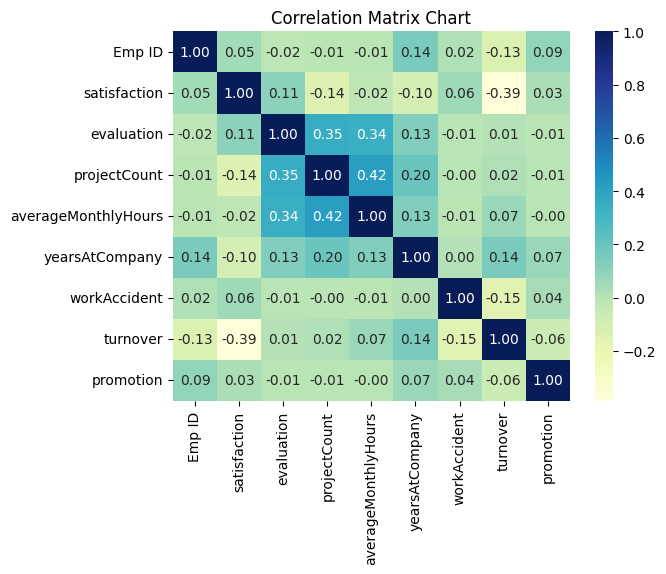

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion
Emp ID,1.000000,0.045841,-0.018168,-0.012124,-0.009850,0.144159,0.015931,-0.129047,0.088994
satisfaction,0.045841,1.000000,0.105021,-0.142970,-0.020048,-0.100866,0.058697,-0.388375,0.025605
evaluation,-0.018168,0.105021,1.000000,0.349333,0.339742,0.131591,-0.007104,0.006567,-0.008684
projectCount,-0.012124,-0.142970,0.349333,1.000000,0.417211,0.196786,-0.004741,0.023787,-0.006064
averageMonthlyHours,-0.009850,-0.020048,0.339742,0.417211,1.000000,0.127755,-0.010143,0.071287,-0.003544
yearsAtCompany,0.144159,-0.100866,0.131591,0.196786,0.127755,1.000000,0.002120,0.144822,0.067433
workAccident,0.015931,0.058697,-0.007104,-0.004741,-0.010143,0.002120,1.000000,-0.154622,0.039245
turnover,-0.129047,-0.388375,0.006567,0.023787,0.071287,0.144822,-0.154622,1.000000,-0.061788
promotion,0.088994,0.025605,-0.008684,-0.006064,-0.003544,0.067433,0.039245,-0.061788,1.000000


In [316]:
# Correction between the features and the target.
corr = df.corr()
corr = (corr)
ax = plt.axes()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, ax=ax, fmt=".2f", cmap="YlGnBu", cbar=True, annot = True)
ax.set_title('Correlation Matrix Chart')
plt.show()
corr

In [317]:
df.columns

Index(['Emp ID', 'satisfaction', 'evaluation', 'projectCount',
       'averageMonthlyHours', 'yearsAtCompany', 'workAccident', 'turnover',
       'promotion', 'dept', 'salary'],
      dtype='object')

In [318]:
df.describe()

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,7500.000000,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,4329.982679,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,1.000000,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,3750.500000,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,7500.000000,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,11249.500000,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,14999.000000,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [319]:
columns_boxplot = ['satisfaction', 'evaluation', 'projectCount'
                   ,'yearsAtCompany', 'workAccident', 'turnover',
       'promotion']

In [320]:
employee_data = df[columns_boxplot]

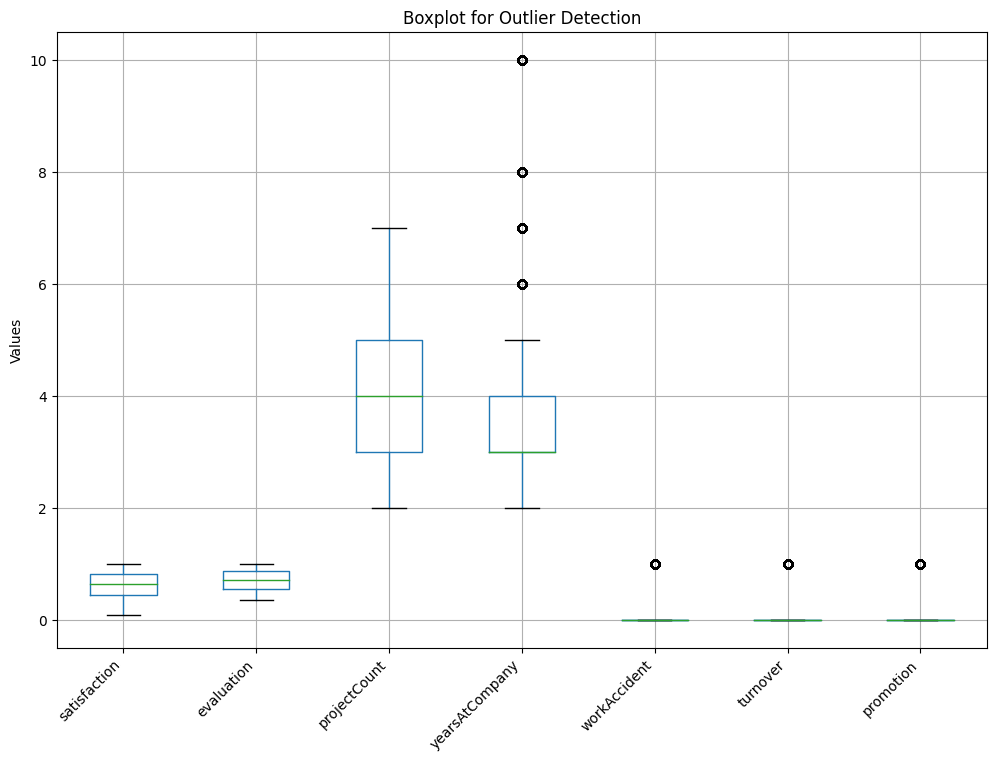

In [321]:
# Create a boxplot for each column in the DataFrame
plt.figure(figsize=(12, 8))
employee_data.boxplot()
plt.title('Boxplot for Outlier Detection')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.ylabel('Values')
plt.show()

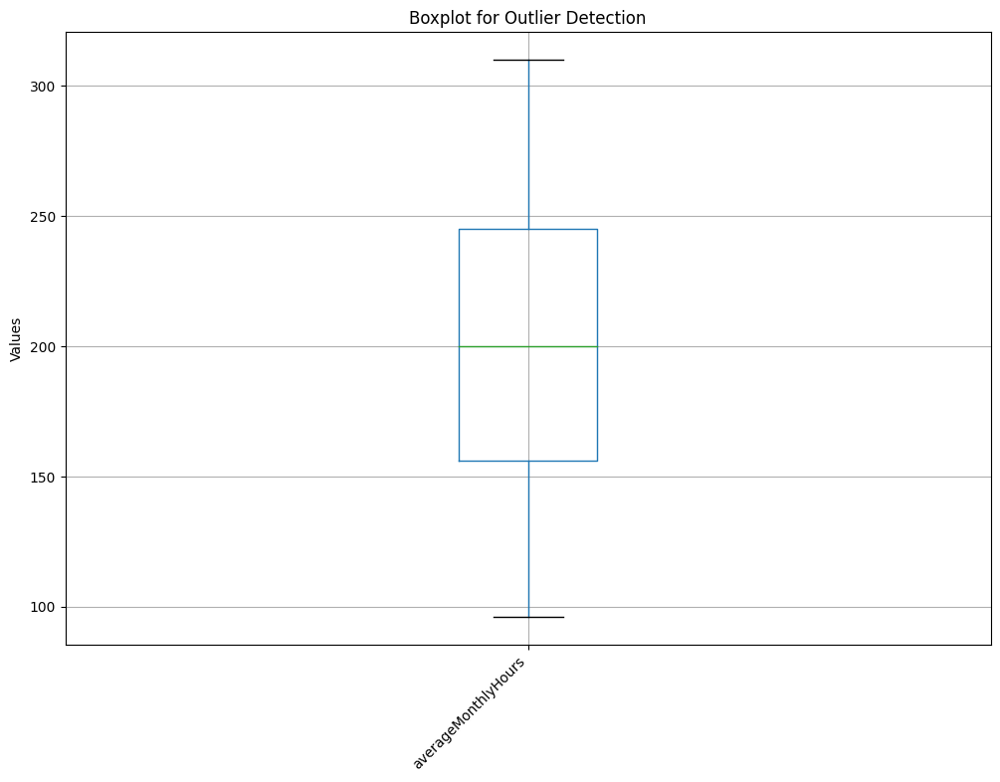

In [322]:
# Create a boxplot for each column in the DataFrame
fig = plt.figure(figsize=(12, 8))
ax = fig.gca()

df.boxplot(column='averageMonthlyHours', ax =ax)
plt.title('Boxplot for Outlier Detection')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.ylabel('Values')
plt.show()

In [323]:
df['yearsAtCompany'].value_counts(normalize=True).map('{:.2%}'.format)

3     42.96%
2     21.63%
4     17.05%
5      9.82%
6      4.79%
10     1.43%
7      1.25%
8      1.08%
Name: yearsAtCompany, dtype: object

In [324]:
df['dept'].value_counts(normalize=True).map('{:.2%}'.format)

sales          27.60%
technical      18.13%
support        14.86%
IT              8.18%
product_mng     6.01%
marketing       5.72%
RandD           5.25%
accounting      5.11%
hr              4.93%
management      4.20%
Name: dept, dtype: object

In [325]:
df['salary'].value_counts(normalize=True).map('{:.2%}'.format)

low       48.78%
medium    42.98%
high       8.25%
Name: salary, dtype: object

In [326]:
fig = px.histogram(df, x="satisfaction", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Satisfaction Level',xaxis_title="Satisfaction",
    yaxis_title="No of Employees")
fig.show()

In [327]:
fig = px.histogram(df, x="satisfaction", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Satisfaction Level',xaxis_title="Satisfaction",
    yaxis_title="No of Employees")
fig.show()

In [328]:
fig = px.histogram(df, x="evaluation", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Evaluation Level',xaxis_title="Evaluation",
    yaxis_title="No of Employees")
fig.show()

In [329]:
fig = px.histogram(df, x="averageMonthlyHours", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Average Monthly Hours',xaxis_title="Average Monthly Hours",
    yaxis_title="No of Employees")
fig.show()